In [41]:
%matplotlib inline
import matplotlib.pyplot as plt
import csv
import math
import numpy as np
import pandas as pd
import scipy as sp
import sklearn as sl
from scipy import stats
from sklearn import datasets
from sklearn import linear_model
from sklearn import svm

In [42]:
#features = csv.reader(open('features4Moments.csv', newline=''), delimiter=',')
features = csv.reader(open('features5.csv', newline=''), delimiter=',')
dataset = list(features)

for i in range(len(dataset)):
    dataset[i] = [float(x) for x in dataset[i]]
    
dataset = np.asarray(dataset)

In [43]:
seed = 1191647
np.random.seed(seed)

print(dataset.shape)

Y = dataset[:,0]      # labels
X = dataset[:,1:]


#Y = dataset[0:86578,0]      # labels only for FB and TW 86578 for features.csv
#X = dataset[0:86578,1:]


def choose_data(dataset,set1,set2):
    Y_fb = dataset[0:50318,0]
    X_fb = dataset[0:50318,1:]
    Y_tw = dataset[50319:86578,0]
    X_tw = dataset[50319:86578,1:]
    Y_gm = dataset[86579:96502,0]
    X_gm = dataset[86579:96502,1:]
    Y_gp = dataset[96503:129973,0]
    X_gp = dataset[96503:129973,1:]
    Y_tu = dataset[129974:186675,0]
    X_tu = dataset[129974:186675,1:]
    Y_dr = dataset[186676:235137,0]
    X_dr = dataset[186676:235137,1:]
    Y_ev = dataset[235138:,0]
    X_ev = dataset[235138:,1:]

    Y1 = "Y_"+set1
    X1 = "X_"+set1
    Y2 = "Y_"+set2
    X2 = "X_"+set2
    Y = np.concatenate((eval(Y1),eval(Y2)),axis=0)
    X = np.concatenate((eval(X1),eval(X2)),axis=0)
    print(Y.shape)
    print(X.shape)
    return Y,X

Y,X = choose_data(dataset,"tw","fb")



#let's sort our data
permutation = np.random.permutation(X.shape[0])

X_new = X[permutation]
Y_new = Y[permutation]



(252151, 6)
(86577,)
(86577, 5)


In [44]:
m_training = math.ceil(Y.shape[0]*0.8)

Y_train, Y_test = Y_new[:m_training], Y_new[m_training:]
X_train, X_test = X_new[:m_training], X_new[m_training:]

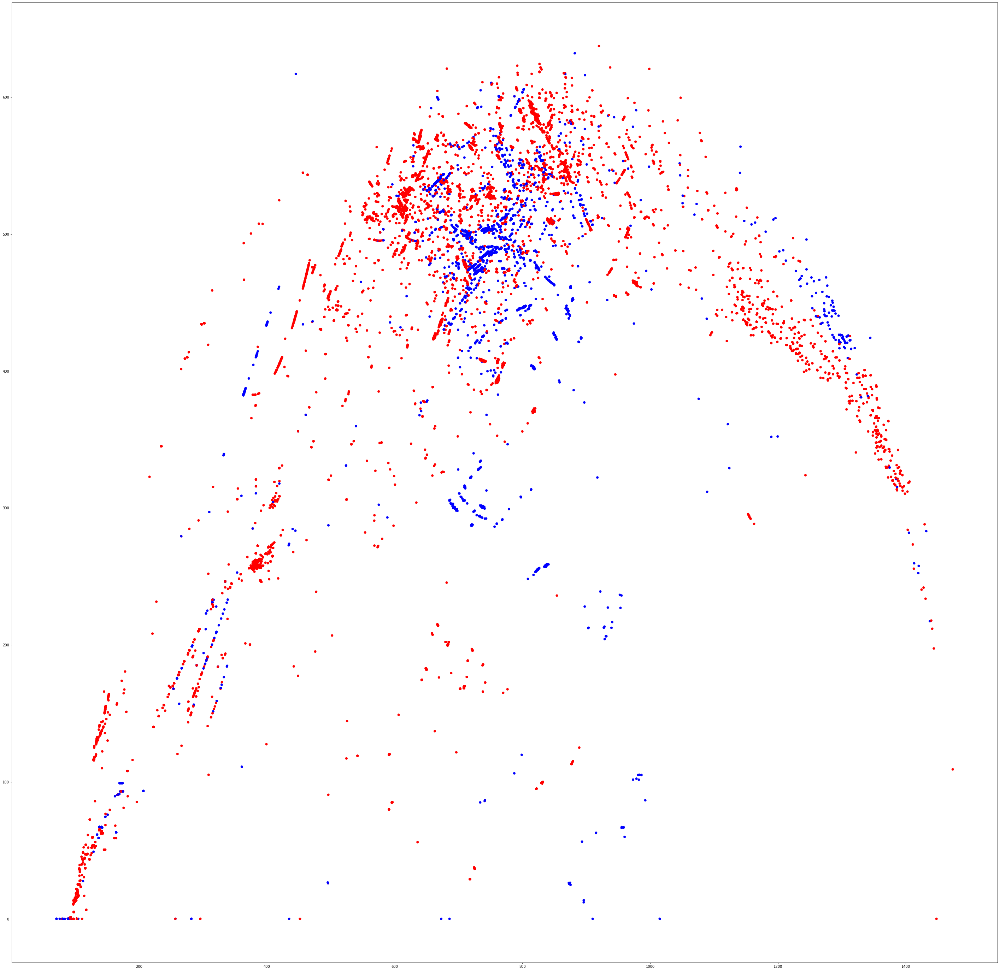

In [45]:
import matplotlib.pyplot as plt
import matplotlib.colors
import pandas as pd

colors = ['red','green','magenta','purple', 'brown', 'cyan', 'blue']

#valid if more than 2 features
fig = plt.figure(figsize=(50,50))
plt.scatter(X_train[:,0], X_train[:,1], c=Y_train, cmap=matplotlib.colors.ListedColormap(colors))


In [46]:
#clf = svm.SVC(decision_function_shape='ovr', kernel= 'rbf' , C = 8, gamma=0.1)
#clf.fit(X_train, Y_train).score(X_train, Y_train)
from sklearn.model_selection import GridSearchCV
from sklearn import svm
params_svm = {
    'kernel' : ['rbf'],  
    'C' : [6.6,6.8,7,7.2,7.4],                
}
svm_clf = svm.SVC()
estimator_svm = GridSearchCV(svm_clf,param_grid=params_svm,cv=2,verbose=1,scoring='accuracy')
estimator_svm.fit(X_train,Y_train)
print(estimator_svm.best_params_)
estimator_svm.best_score_

Fitting 2 folds for each of 5 candidates, totalling 10 fits
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:  9.7min finished
{'C': 6.6, 'kernel': 'rbf'}


0.7319020530738356

In [47]:
import joblib
# save
joblib.dump(estimator_svm, "model_svm.pkl") 


['model_svm.pkl']

In [48]:
pred_cls = estimator_svm.predict(X_test[1:])
#how many wrong in test set?
wrong= 0
for i in range(0, Y_test.shape[0]-1):
    if Y_test[i] != pred_cls[i]:
        wrong = wrong + 1
print('total wrong: '+ str(wrong))
perc = wrong/len(Y_test)
print(perc)


total wrong: 8910
0.5145827317354894
